## Brazilian congresspeople and their banquets
Brazilan congresspeople are famous for spending money on [fancy food](https://www.metropoles.com/brasil/politica-brasil/sem-limite-de-gastos-congresso-reembolsa-despesas-de-parlamentares-com-ostras-e-camarao-trufado). The Congress [states](https://www2.camara.leg.br/comunicacao/assessoria-de-imprensa/guia-para-jornalistas/cota-parlamentar) that they can only use their money to pay for their own meals, but this analysis shows that some of them  pay even thousands of reais for dozens of meals in the same receipt.

Let's check how expensive those lunchs and banquets were since they took office in 2019 and if there's any transparency on what exactly they're eating.

The data source can be found [here](https://dadosabertos.camara.leg.br/swagger/api.html#staticfile).

## Disclaimer
This is a data assignment for a master of science in data Journalism class at Columbia University.

In [25]:
import pandas as pd
import numpy as np
from plotnine import *

In [26]:
#extracting the data from 2019, 2020 and 2021 CSV files

df2021 = pd.read_csv('Ano-2021.csv', sep=';')
df2020 = pd.read_csv('Ano-2020.csv', sep=';')
df2019 = pd.read_csv('Ano-2019.csv', sep=';')
pd.set_option('display.max_colwidth', 100000)
pd.set_option('display.max_columns', 100000)
pd.set_option('display.max_rows', 100000)

In [27]:
#organizing the CSVs together
df = pd.concat([df2021, df2020, df2019])

In [28]:
#explore the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 646913 entries, 0 to 289395
Data columns (total 31 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   txNomeParlamentar          646913 non-null  object 
 1   cpf                        644673 non-null  float64
 2   ideCadastro                644771 non-null  float64
 3   nuCarteiraParlamentar      644771 non-null  float64
 4   nuLegislatura              646913 non-null  int64  
 5   sgUF                       644771 non-null  object 
 6   sgPartido                  644771 non-null  object 
 7   codLegislatura             646913 non-null  int64  
 8   numSubCota                 646913 non-null  int64  
 9   txtDescricao               646913 non-null  object 
 10  numEspecificacaoSubCota    646913 non-null  int64  
 11  txtDescricaoEspecificacao  158892 non-null  object 
 12  txtFornecedor              646880 non-null  object 
 13  txtCNPJCPF                 60

In [29]:
#types of congresspeople expense
df.txtDescricao.unique()

array(['FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR',
       'MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR',
       'CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS.',
       'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.',
       'ASSINATURA DE PUBLICAÇÕES', 'COMBUSTÍVEIS E LUBRIFICANTES.',
       'LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES',
       'PASSAGEM AÉREA - REEMBOLSO', 'TELEFONIA',
       'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL.',
       'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO', 'SERVIÇOS POSTAIS',
       'LOCAÇÃO OU FRETAMENTO DE AERONAVES', 'PASSAGEM AÉREA - RPA',
       'PASSAGEM AÉREA - SIGEPA',
       'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA.',
       'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS',
       'LOCAÇÃO OU FRETAMENTO DE EMBARCAÇÕES',
       'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR'], dtype=object)

In [30]:
#how much was spent by congresspeople in 2019, 2020 and 2021?

pd.set_option('display.float_format', lambda x: '%.2f' % x) #<--- display full numbers

df.groupby(by='numAno').vlrDocumento.sum()


numAno
2019   213908623.11
2020   175970689.37
2021   194298773.75
Name: vlrDocumento, dtype: float64

<AxesSubplot:xlabel='numAno'>

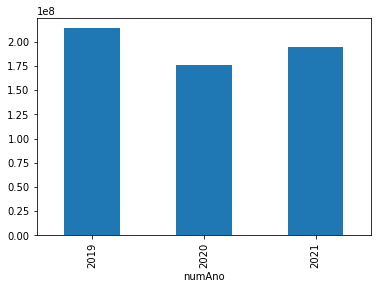

In [31]:
df.groupby(by='numAno').vlrDocumento.sum().plot(kind='bar')

In [32]:
# how much was spent in the last 3 years (2019, 2020 and 2021) with mandate expenses
df.groupby(by='txtDescricao').vlrDocumento.sum().sort_values(ascending=False)

txtDescricao
DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.                        165051333.38
LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES                79095286.49
PASSAGEM AÉREA - RPA                                         78064726.09
MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR    72093908.18
CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS.                64971556.39
COMBUSTÍVEIS E LUBRIFICANTES.                                43423932.59
PASSAGEM AÉREA - SIGEPA                                      38079775.70
TELEFONIA                                                    14094432.75
PASSAGEM AÉREA - REEMBOLSO                                    6837998.75
SERVIÇOS POSTAIS                                              4616382.36
HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL.        4447996.13
LOCAÇÃO OU FRETAMENTO DE AERONAVES                            4339796.90
SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA.      2967671.58
FORNECIMENTO DE ALIMENTAÇÃO DO PARLAME

In [33]:
# same as above but in %
agrupado = (df.groupby(by='txtDescricao').vlrDocumento.sum() / df.vlrDocumento.sum()).sort_values(ascending=False)
agrupado = pd.DataFrame(agrupado.to_frame())
agrupado = pd.DataFrame(agrupado.to_records())
agrupado

,txtDescricao,vlrDocumento
0,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.,0.28
1,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,0.14
2,PASSAGEM AÉREA - RPA,0.13
3,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR,0.12
4,"CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS.",0.11
5,COMBUSTÍVEIS E LUBRIFICANTES.,0.07
6,PASSAGEM AÉREA - SIGEPA,0.07
7,TELEFONIA,0.02
8,PASSAGEM AÉREA - REEMBOLSO,0.01
9,SERVIÇOS POSTAIS,0.01


In [34]:
#display only food

df_food = df[df.txtDescricao == 'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR']
df_food.head(5)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao,txtFornecedor,txtCNPJCPF,txtNumero,indTipoDocumento,datEmissao,vlrDocumento,vlrGlosa,vlrLiquido,numMes,numAno,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
0,LIDERANÇA DO AVANTE,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,BAR E RESTAURANTE TIA ZELIA LTDA ME,124.952.400/0019-3,33,0,2021-10-27T00:00:00,526.00,0.00,526.00,10,2021,0,NaN,NaN,1804721,NaN,NaN,3175,7279467,https://www.camara.leg.br/cota-parlamentar/documentos/publ/3175/2021/7279467.pdf
1,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,104,4,2021-03-04T00:00:00,999.96,0.00,999.96,3,2021,0,NaN,NaN,1751471,NaN,NaN,3453,7165735,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7165735
2,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,111,4,2021-03-11T00:00:00,999.96,0.00,999.96,3,2021,0,NaN,NaN,1752542,NaN,NaN,3453,7167891,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7167891
3,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,116,4,2021-03-17T00:00:00,999.96,0.00,999.96,3,2021,0,NaN,NaN,1753004,NaN,NaN,3453,7168798,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7168798
4,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,130,4,2021-04-12T00:00:00,999.96,0.00,999.96,4,2021,0,NaN,NaN,1758032,NaN,NaN,3453,7178054,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7178054


In [35]:
#how much was spent in FOOD 2019, 2020 and 2021?

df_food.groupby(by='numAno').vlrDocumento.sum()

numAno
2019   1313636.29
2020    334722.79
2021    747740.29
Name: vlrDocumento, dtype: float64

<AxesSubplot:xlabel='numAno'>

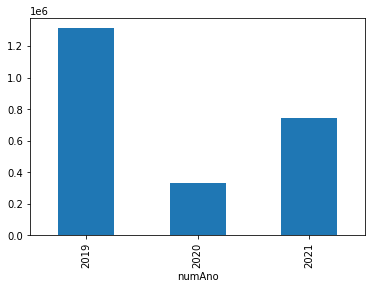

In [36]:
df_food.groupby(by='numAno').vlrDocumento.sum().plot(kind='bar')

In [176]:
# how the data actually looks like
df_food.head(5)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao,txtFornecedor,txtCNPJCPF,txtNumero,indTipoDocumento,datEmissao,vlrDocumento,vlrGlosa,vlrLiquido,numMes,numAno,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
0,LIDERANÇA DO AVANTE,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,BAR E RESTAURANTE TIA ZELIA LTDA ME,124.952.400/0019-3,33,0,2021-10-27T00:00:00,526.00,0.00,526.00,10,2021,0,NaN,NaN,1804721,NaN,NaN,3175,7279467,https://www.camara.leg.br/cota-parlamentar/documentos/publ/3175/2021/7279467.pdf
1,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,104,4,2021-03-04T00:00:00,999.96,0.00,999.96,3,2021,0,NaN,NaN,1751471,NaN,NaN,3453,7165735,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7165735
2,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,111,4,2021-03-11T00:00:00,999.96,0.00,999.96,3,2021,0,NaN,NaN,1752542,NaN,NaN,3453,7167891,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7167891
3,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,116,4,2021-03-17T00:00:00,999.96,0.00,999.96,3,2021,0,NaN,NaN,1753004,NaN,NaN,3453,7168798,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7168798
4,LIDERANÇA DO CIDADANIA,NaN,NaN,NaN,2019,NaN,NaN,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,ARTESANAL SERVICOS DE ALIMENTACAO E BUFFET EIRELI,228.362.100/0015-7,130,4,2021-04-12T00:00:00,999.96,0.00,999.96,4,2021,0,NaN,NaN,1758032,NaN,NaN,3453,7178054,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7178054


In [37]:
#we need to remove those "lideranças" and keep only individuals

df.drop(df[df.txNomeParlamentar.str.contains("liderança", na=False, case=False)]\
.index, inplace = True)
df.drop(df[df.txNomeParlamentar.str.contains("lidmin", na=False, case=False)]\
.index, inplace = True)


In [84]:
#then update df_food to have only individuals



df_food = df[df.txtDescricao == 'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR']
df_food.head(5)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao,txtFornecedor,txtCNPJCPF,txtNumero,indTipoDocumento,datEmissao,vlrDocumento,vlrGlosa,vlrLiquido,numMes,numAno,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
1103,Danilo Forte,12133728368.00,62881.00,558.00,2019,CE,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,BANGS CARNES E BEBIDAS,161.061.270/0012-0,034350,0,2021-10-07T00:00:00,120.00,55.15,64.85,10,2021,0,NaN,NaN,1801265,NaN,NaN,2227,7270811,https://www.camara.leg.br/cota-parlamentar/documentos/publ/2227/2021/7270811.pdf
1104,Danilo Forte,12133728368.00,62881.00,558.00,2019,CE,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,BUCA SERVICOS DE ALIMENTACAO LTDA,224.578.410/0016-5,065958,0,2021-02-15T00:00:00,90.00,0.00,90.00,2,2021,0,NaN,NaN,1745650,NaN,NaN,2227,7154817,https://www.camara.leg.br/cota-parlamentar/documentos/publ/2227/2021/7154817.pdf
1105,Danilo Forte,12133728368.00,62881.00,558.00,2019,CE,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,C.B. BRASILIA COMERCIO DE ALIMENTOS LTDA,119.037.890/0010-7,121286,0,2021-12-17T00:00:00,120.00,0.00,120.00,12,2021,0,NaN,NaN,1817939,NaN,NaN,2227,7308443,https://www.camara.leg.br/cota-parlamentar/documentos/publ/2227/2021/7308443.pdf
1106,Danilo Forte,12133728368.00,62881.00,558.00,2019,CE,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,C.B. BRASILIA COMERCIO DE ALIMENTOS LTDA,119.037.890/0010-7,42646,4,2021-01-28T00:00:00,100.00,0.00,100.00,1,2021,0,NaN,NaN,1741482,NaN,NaN,2227,7146572,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7146572
1107,Danilo Forte,12133728368.00,62881.00,558.00,2019,CE,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,C.B. BRASILIA COMERCIO DE ALIMENTOS LTDA,119.037.890/0010-7,58999,0,2021-05-06T00:00:00,110.00,17.73,92.27,5,2021,0,NaN,NaN,1763607,NaN,NaN,2227,7190483,https://www.camara.leg.br/cota-parlamentar/documentos/publ/2227/2021/7190483.pdf


In [86]:
#how it looks now, without "lideranças"

df_food.head(1)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao,txtFornecedor,txtCNPJCPF,txtNumero,indTipoDocumento,datEmissao,vlrDocumento,vlrGlosa,vlrLiquido,numMes,numAno,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
1103,Danilo Forte,12133728368.00,62881.00,558.00,2019,CE,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,BANGS CARNES E BEBIDAS,161.061.270/0012-0,034350,0,2021-10-07T00:00:00,120.00,55.15,64.85,10,2021,0,NaN,NaN,1801265,NaN,NaN,2227,7270811,https://www.camara.leg.br/cota-parlamentar/documentos/publ/2227/2021/7270811.pdf


In [88]:
#2019, 2020 and 2021 congresspeople ranking by food expenses

ranking = df_food.groupby(by='txNomeParlamentar').vlrDocumento.sum().sort_values(ascending=False)

#turn it into a dataframe
ranking_df = ranking.reset_index()
ranking_df.head(5)


,txNomeParlamentar,vlrDocumento
0,Bibo Nunes,39753.13
1,David Soares,36439.81
2,André de Paula,33344.63
3,Zeca Dirceu,27040.15
4,João Carlos Bacelar,25031.70


In [92]:
# number of receipts for each federal deputy
receipt_df = df_food.txNomeParlamentar.value_counts()
receipt_df

#turn it into a dataframe
receipt_df = receipt_df.reset_index()
receipt_df

,index,txNomeParlamentar
0,David Soares,661
1,Bibo Nunes,652
2,Vanderlei Macris,548
3,Abou Anni,527
4,André de Paula,519
5,Eduardo Cury,511
6,Zeca Dirceu,497
7,General Peternelli,480
8,Claudio Cajado,409
9,Jorge Solla,390


In [99]:
#merge tables for a final dataaset with the sum of receipts and number of receipts

num_receipts = ranking_df.merge(receipt_df[['index', 'txNomeParlamentar']], how = 'left',
                left_on = 'txNomeParlamentar', right_on = 'index').drop(columns= ['index'])

num_receipts['avg_per_receipt'] = num_receipts.vlrDocumento / num_receipts.txNomeParlamentar_y
num_receipts

,txNomeParlamentar_x,vlrDocumento,txNomeParlamentar_y,avg_per_receipt
0,Bibo Nunes,39753.13,652,60.97
1,David Soares,36439.81,661,55.13
2,André de Paula,33344.63,519,64.25
3,Zeca Dirceu,27040.15,497,54.41
4,João Carlos Bacelar,25031.70,289,86.61
5,Claudio Cajado,23383.78,409,57.17
6,Eduardo Cury,23119.99,511,45.24
7,Ricardo Guidi,22415.46,362,61.92
8,Rubens Bueno,22355.11,270,82.80
9,Abou Anni,22137.56,527,42.01


In [100]:
num_receipts.to_csv('avg_per_receipt.csv', index=False)

In [196]:
#most expensive meals

df_food.sort_values(by='vlrDocumento', ascending=False).head(100)


,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao,txtFornecedor,txtCNPJCPF,txtNumero,indTipoDocumento,datEmissao,vlrDocumento,vlrGlosa,vlrLiquido,numMes,numAno,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
271064,Alexandre Frota,75199270753.00,204544.00,340.00,2019,SP,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,HOTEL NACIONAL SA,726.291.400/0013-4,186206,4,2019-10-03T00:00:00,3611.30,328.30,3283.00,9,2019,0,NaN,NaN,1639787,NaN,NaN,3424,6933043,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6933043
271063,Alexandre Frota,75199270753.00,204544.00,340.00,2019,SP,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,HOTEL NACIONAL SA,726.291.400/0013-4,182525,4,2019-09-04T00:00:00,2211.00,355.10,1855.90,9,2019,0,NaN,NaN,1630131,NaN,NaN,3424,6911305,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6911305
6039,Rubens Bueno,18746420959.00,73466.00,460.00,2019,PR,CIDADANIA,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,Hotelaria Accor Brasil S/A,099.678.520/0616-8,48,4,2019-10-02T00:00:00,1400.00,0.00,1400.00,10,2019,0,NaN,NaN,1640199,NaN,NaN,831,6934052,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6934052
6034,Rubens Bueno,18746420959.00,73466.00,460.00,2019,PR,CIDADANIA,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,Hotelaria Accor Brasil S/A,099.678.520/0616-8,31,4,2019-04-15T00:00:00,1280.00,18.00,1262.00,4,2019,0,NaN,NaN,1585209,NaN,NaN,831,6807400,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6807400
271061,Alexandre Frota,75199270753.00,204544.00,340.00,2019,SP,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,HOTEL NACIONAL SA,726.291.400/0013-4,175445,4,2019-07-04T00:00:00,1273.00,0.00,1273.00,7,2019,0,NaN,NaN,1611519,NaN,NaN,3424,6868145,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6868145
271065,Alexandre Frota,75199270753.00,204544.00,340.00,2019,SP,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,HOTEL NACIONAL SA,726.291.400/0013-4,190270,4,2019-11-04T23:00:00,1252.90,113.90,1139.00,10,2019,0,NaN,NaN,1650925,NaN,NaN,3424,6958179,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6958179
6038,Rubens Bueno,18746420959.00,73466.00,460.00,2019,PR,CIDADANIA,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,Hotelaria Accor Brasil S/A,099.678.520/0616-8,41,4,2019-08-04T00:00:00,1200.00,53.50,1146.50,8,2019,0,NaN,NaN,1619063,NaN,NaN,831,6886112,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6886112
153279,Alexandre Frota,75199270753.00,204544.00,340.00,2019,SP,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,HOTEL NACIONAL SA,726.291.400/0013-4,201005,4,2020-03-03T00:00:00,1105.50,100.50,1005.00,2,2020,0,NaN,NaN,1683925,NaN,NaN,3424,7031065,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7031065
186977,Bia Kicis,38567792134.00,204374.00,409.00,2019,DF,PSL,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,COMPANHIA TRANSAMERICA DE HOTEIS SAO PAULO,432.129.430/0019-0,00345699,0,2019-10-14T00:00:00,993.90,0.00,72.00,10,2019,0,NaN,NaN,1642460,NaN,NaN,3402,6939207,https://www.camara.leg.br/cota-parlamentar/documentos/publ/3402/2019/6939207.pdf
271058,Alexandre Frota,75199270753.00,204544.00,340.00,2019,SP,PSDB,56,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,HOTEL NACIONAL SA,726.291.400/0013-4,165440,4,2019-04-04T00:00:00,958.10,0.00,958.10,4,2019,0,NaN,NaN,1582161,NaN,NaN,3424,6800376,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6800376


In [200]:
#reduce the number of columns

meals = df_food[['txNomeParlamentar', 'txtFornecedor', 'datEmissao', 'vlrDocumento', 'urlDocumento']]



meals.sort_values(by='vlrDocumento', ascending=False)



,txNomeParlamentar,txtFornecedor,datEmissao,vlrDocumento,urlDocumento
271064,Alexandre Frota,HOTEL NACIONAL SA,2019-10-03T00:00:00,3611.30,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6933043
271063,Alexandre Frota,HOTEL NACIONAL SA,2019-09-04T00:00:00,2211.00,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6911305
6039,Rubens Bueno,Hotelaria Accor Brasil S/A,2019-10-02T00:00:00,1400.00,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6934052
6034,Rubens Bueno,Hotelaria Accor Brasil S/A,2019-04-15T00:00:00,1280.00,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6807400
271061,Alexandre Frota,HOTEL NACIONAL SA,2019-07-04T00:00:00,1273.00,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6868145
271065,Alexandre Frota,HOTEL NACIONAL SA,2019-11-04T23:00:00,1252.90,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6958179
6038,Rubens Bueno,Hotelaria Accor Brasil S/A,2019-08-04T00:00:00,1200.00,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6886112
153279,Alexandre Frota,HOTEL NACIONAL SA,2020-03-03T00:00:00,1105.50,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=7031065
186977,Bia Kicis,COMPANHIA TRANSAMERICA DE HOTEIS SAO PAULO,2019-10-14T00:00:00,993.90,https://www.camara.leg.br/cota-parlamentar/documentos/publ/3402/2019/6939207.pdf
271058,Alexandre Frota,HOTEL NACIONAL SA,2019-04-04T00:00:00,958.10,http://camara.leg.br/cota-parlamentar/nota-fiscal-eletronica?ideDocumentoFiscal=6800376


In [202]:
meals.to_csv('congresspeople_meals.csv', index=False)
